In [1]:
import tensorflow as tf
from tensorflow.keras import layers

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
import os

tf.__version__

'2.5.0'

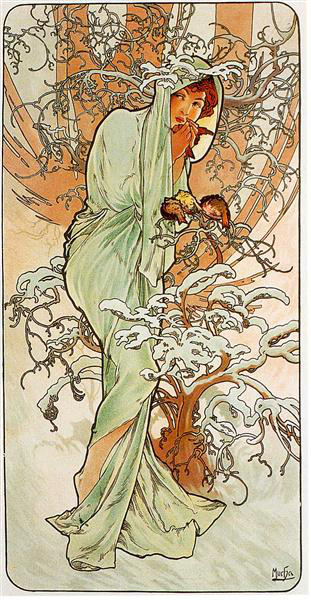

In [2]:
path = './alfons_mucha_winter_1896.jpg'
original_img = tf.keras.preprocessing.image.load_img(path)
original_img

In [3]:
img_height, img_width, channels = tf.keras.preprocessing.image.img_to_array(original_img).shape
print(img_height, img_width, channels)

600 311 3


In [4]:
tf.expand_dims(original_img, 0)[0].shape

TensorShape([600, 311, 3])

In [5]:
def display_augmentation(image, data_augmentation=None, cmap=None):
    
    # change 3D-Tensor to 4D of shape=(1, 600, 311, 3)
    image = tf.expand_dims(image, 0)

    plt.figure(figsize=(15, 15))

    for i in range(9):
        
        # augment image
        augmented_image = data_augmentation(image)
        
        ax = plt.subplot(3, 3, i + 1)
    
        plt.imshow(augmented_image[0], cmap)

        plt.axis("off")


# 1. [Random Flip](https://www.tensorflow.org/versions/r2.5/api_docs/python/tf/keras/layers/experimental/preprocessing/RandomFlip)

Randomly flip each image horizontally and/or vertically.

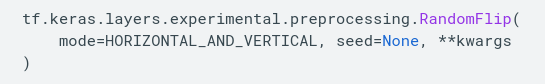

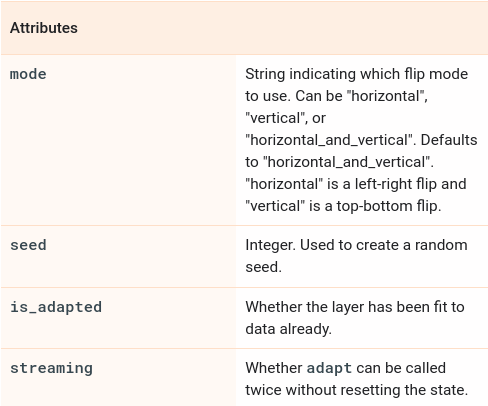

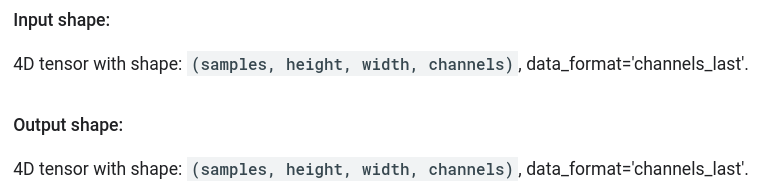

## Horizontal + Vertical

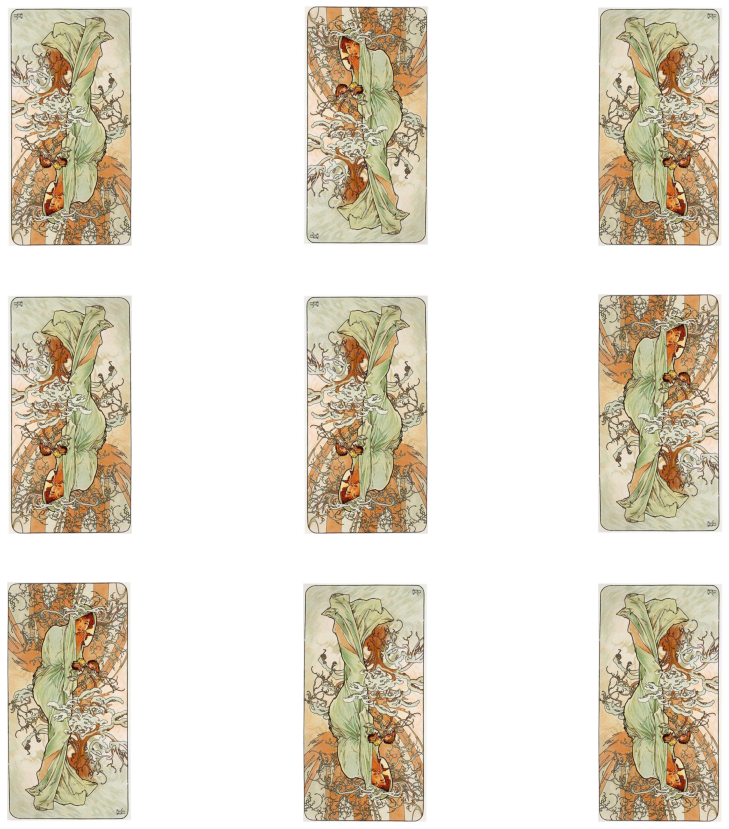

In [6]:
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip

image = original_img

data_augmentation = tf.keras.Sequential([
  RandomFlip("horizontal_and_vertical"),
])

display_augmentation(image, data_augmentation)

## Vertical

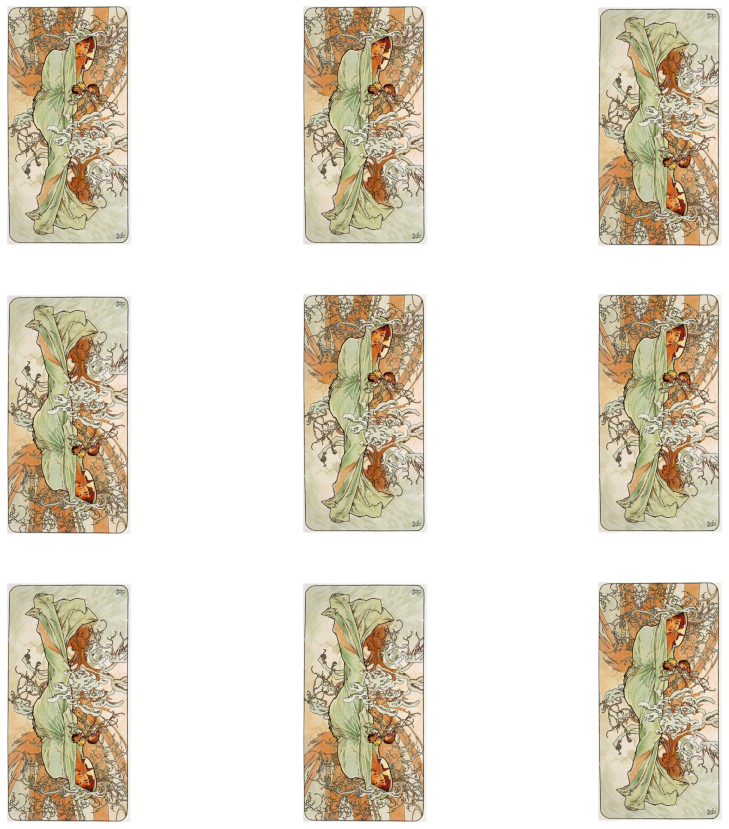

In [7]:
image = original_img

data_augmentation = tf.keras.Sequential([
  RandomFlip("vertical"),
])

display_augmentation(image, data_augmentation)

## Horizontal

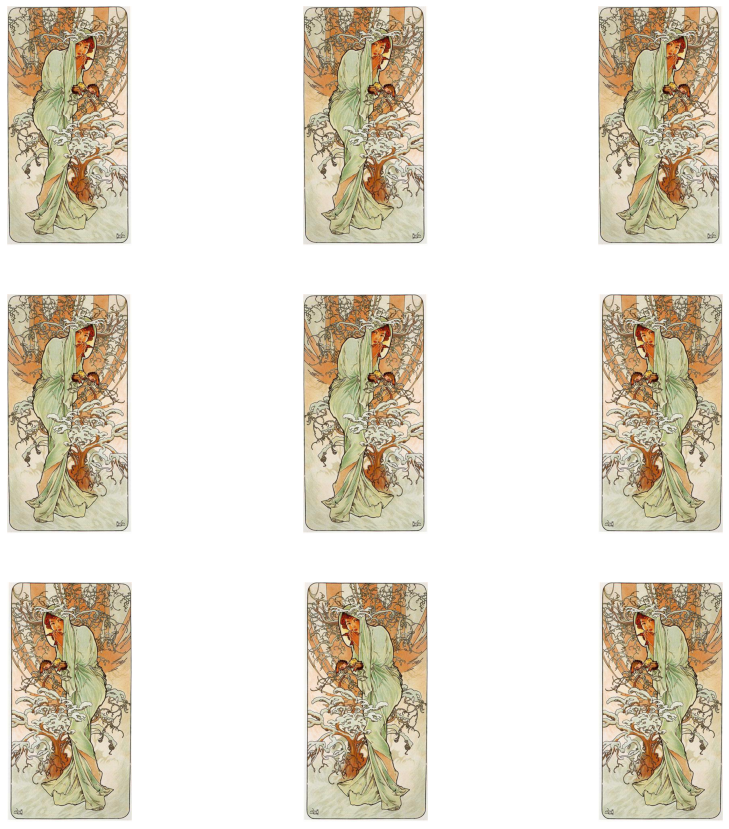

In [8]:
image = original_img

data_augmentation = tf.keras.Sequential([
  RandomFlip("horizontal"),
])

display_augmentation(image, data_augmentation)

# 2. [Random Rotation](https://www.tensorflow.org/versions/r2.5/api_docs/python/tf/keras/layers/experimental/preprocessing/RandomRotation)

Randomly rotate each image.

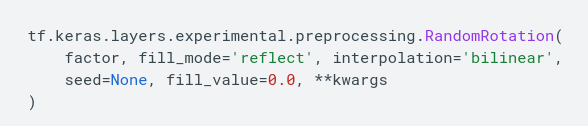

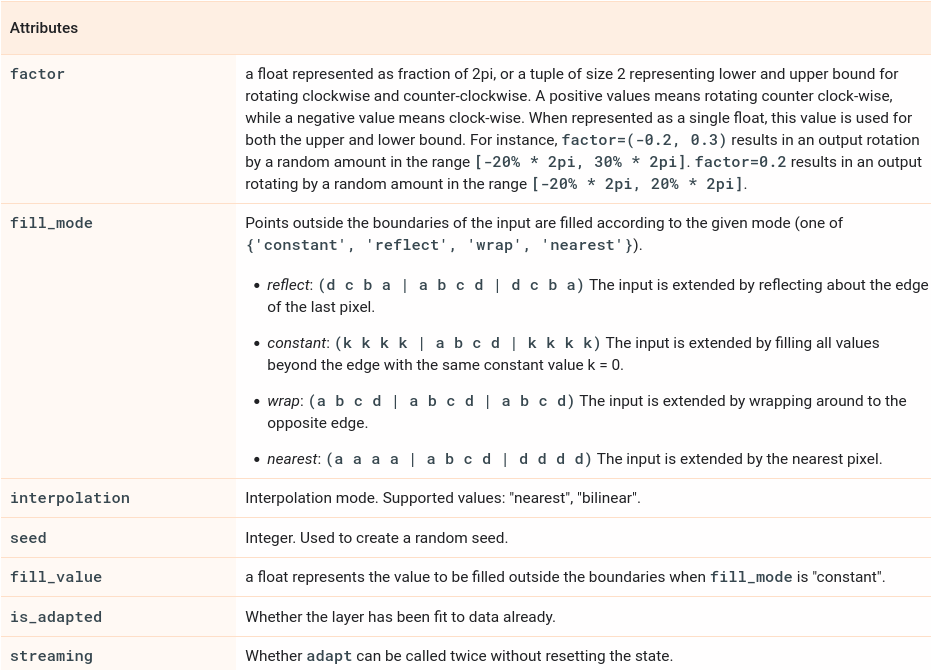

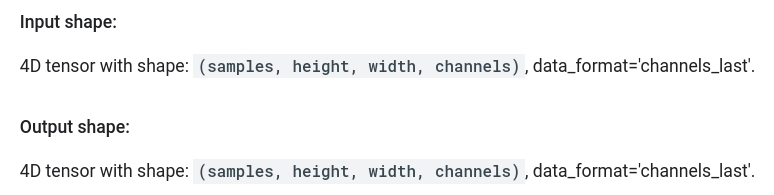

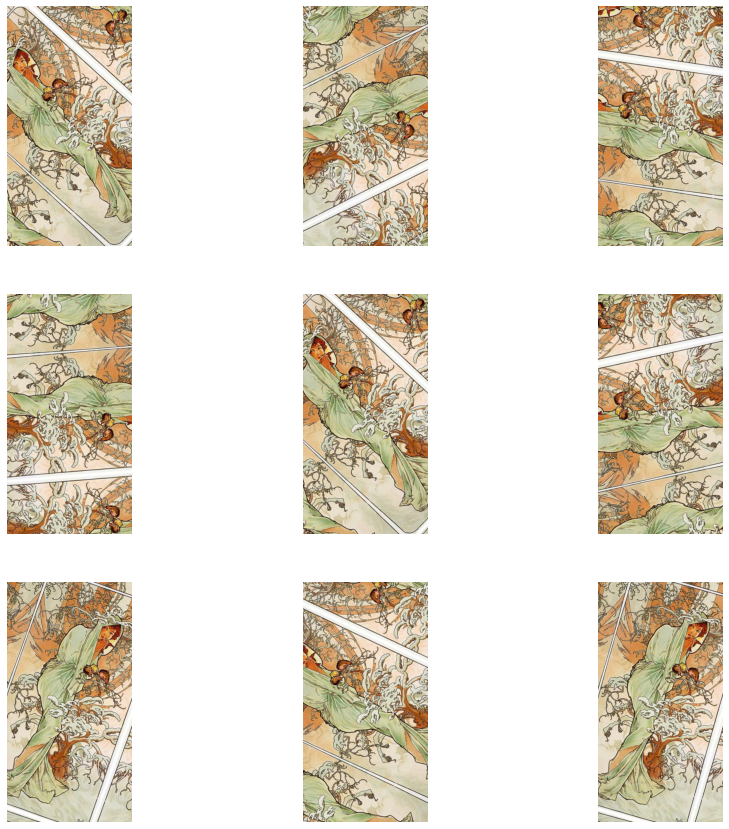

In [9]:
from tensorflow.keras.layers.experimental.preprocessing import RandomRotation

image = original_img

data_augmentation = tf.keras.Sequential([
  RandomRotation(0.3),
])

display_augmentation(image, data_augmentation)

# 3. [Random Crop](https://www.tensorflow.org/versions/r2.5/api_docs/python/tf/keras/layers/experimental/preprocessing/RandomCrop)

Randomly crop the images to target height and width.

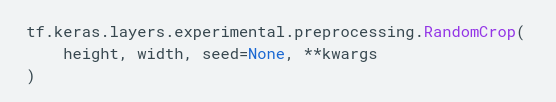

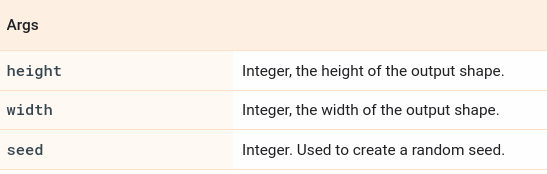

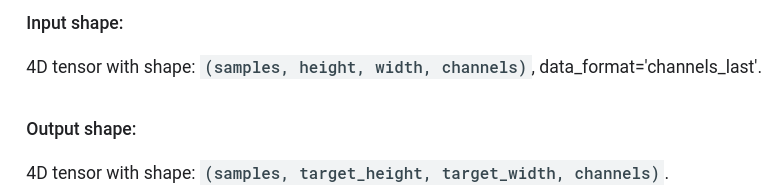

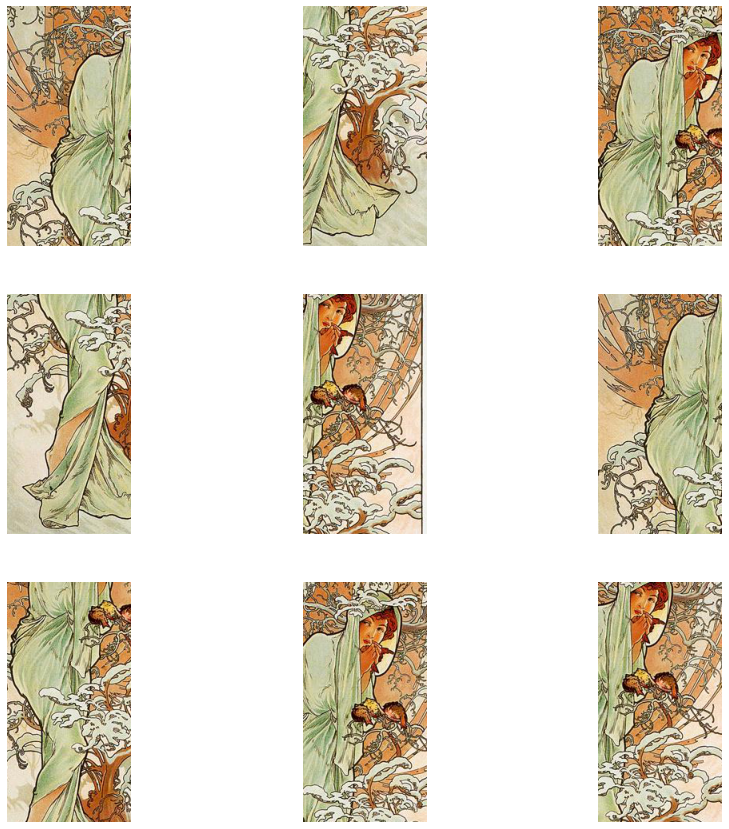

In [10]:
from tensorflow.keras.layers.experimental.preprocessing import RandomCrop

image = original_img

data_augmentation = tf.keras.Sequential([
  RandomCrop(int(img_height/2), int(img_width/2)),
])

display_augmentation(image, data_augmentation)

# 4. [Random Contrast](https://www.tensorflow.org/versions/r2.5/api_docs/python/tf/keras/layers/experimental/preprocessing/RandomContrast)

Adjust the contrast of an image or images by a random factor.

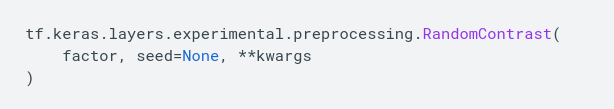

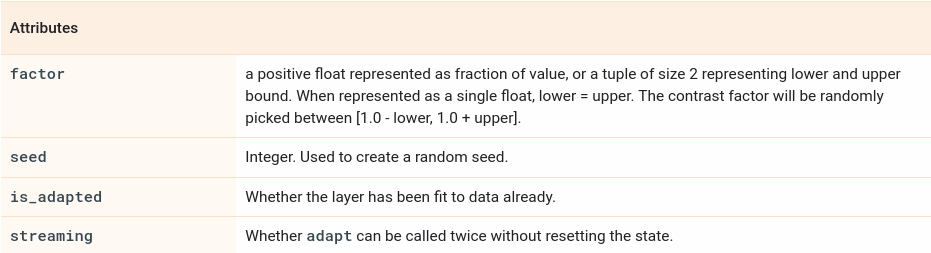

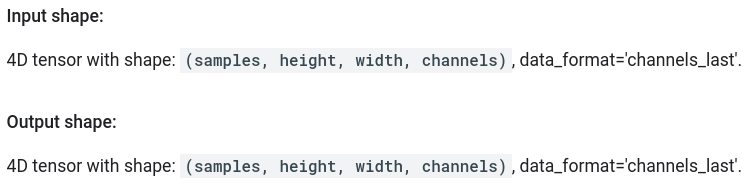

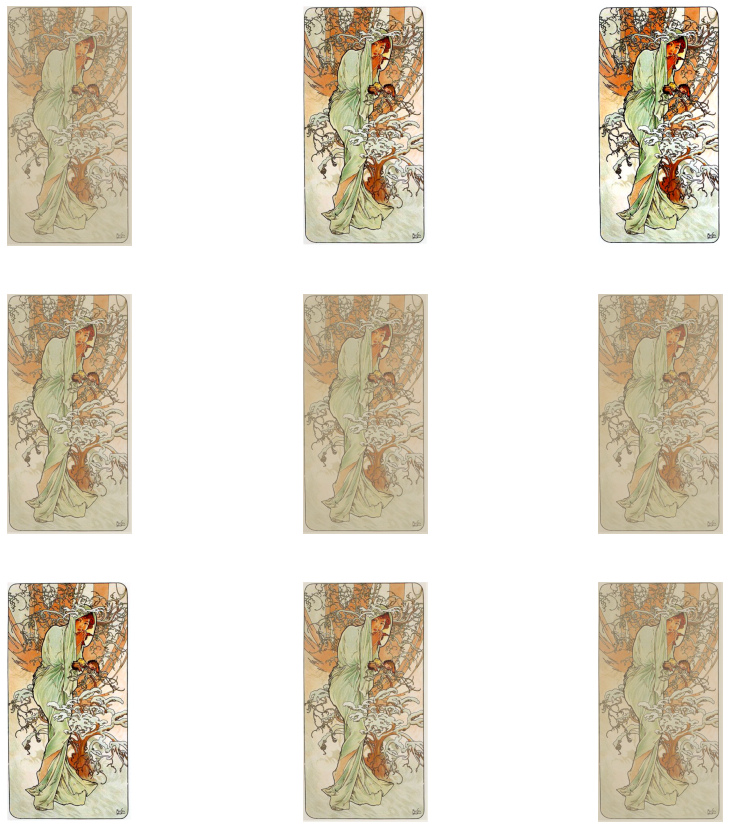

In [11]:
from tensorflow.keras.layers.experimental.preprocessing import RandomContrast

image = original_img

data_augmentation = tf.keras.Sequential([
  RandomContrast(0.7),
])

display_augmentation(image, data_augmentation)

# 5. [Random Height](https://www.tensorflow.org/versions/r2.5/api_docs/python/tf/keras/layers/experimental/preprocessing/RandomHeight)

Randomly vary the height of an image or images.

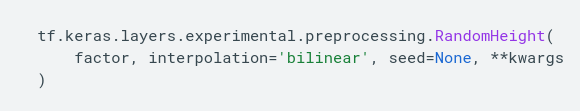

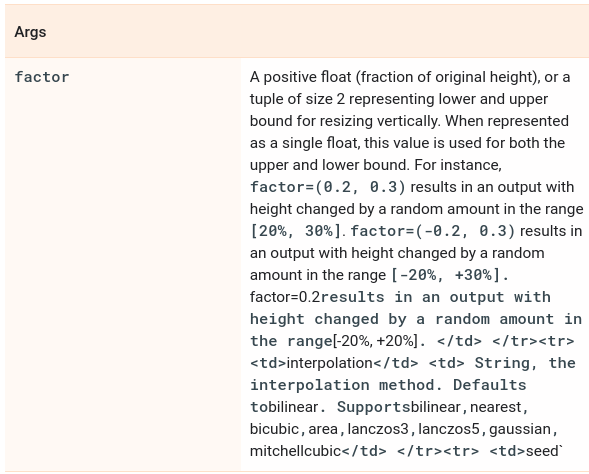

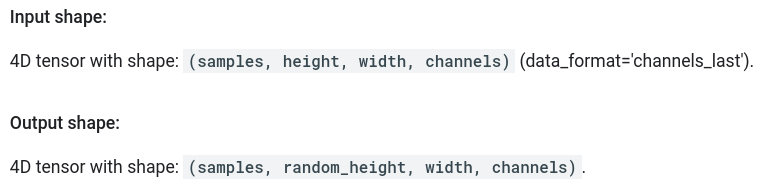

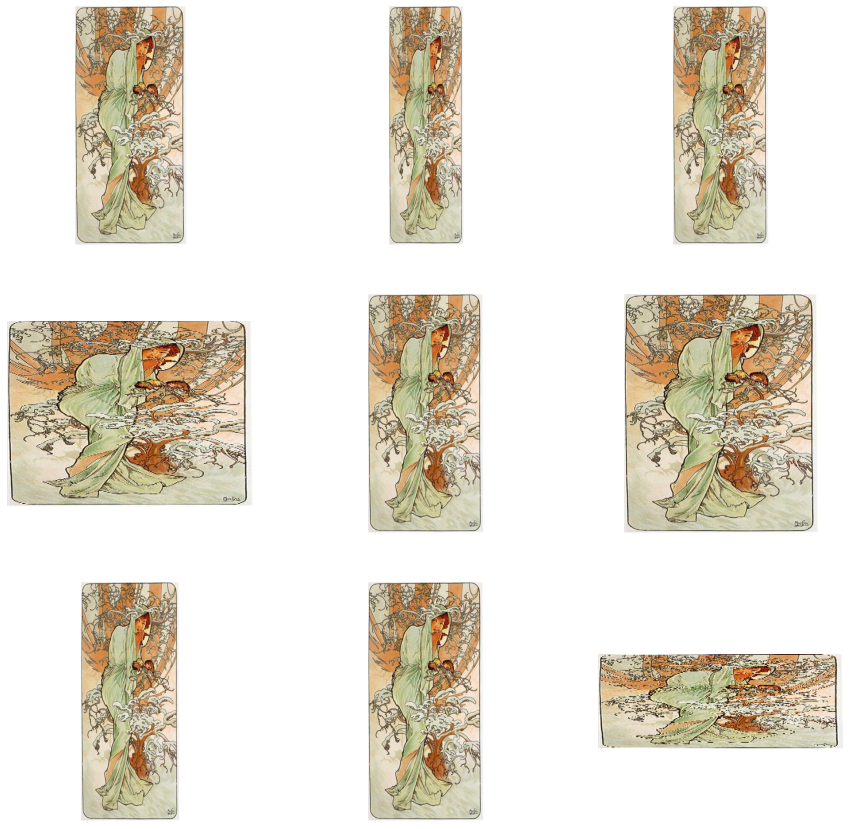

In [12]:
from tensorflow.keras.layers.experimental.preprocessing import RandomHeight, Rescaling

image = original_img

data_augmentation = tf.keras.Sequential([
    Rescaling(1./255),
    RandomHeight(factor=(-0.8, 0.8))
])

display_augmentation(image, data_augmentation)

# 6. [Random  Translation](https://www.tensorflow.org/versions/r2.5/api_docs/python/tf/keras/layers/experimental/preprocessing/RandomTranslation)

Randomly translate each image during training.

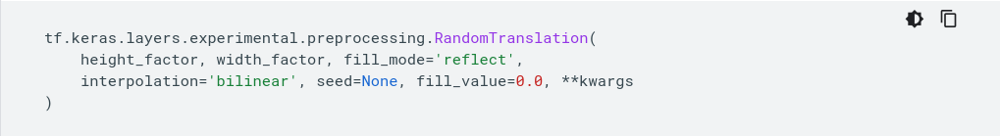

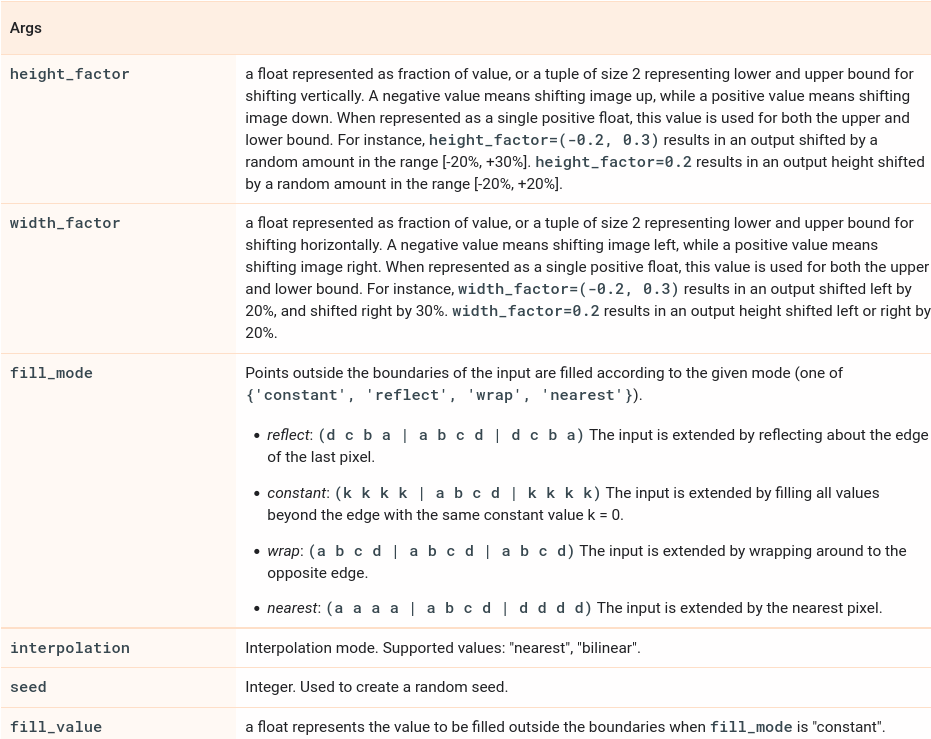

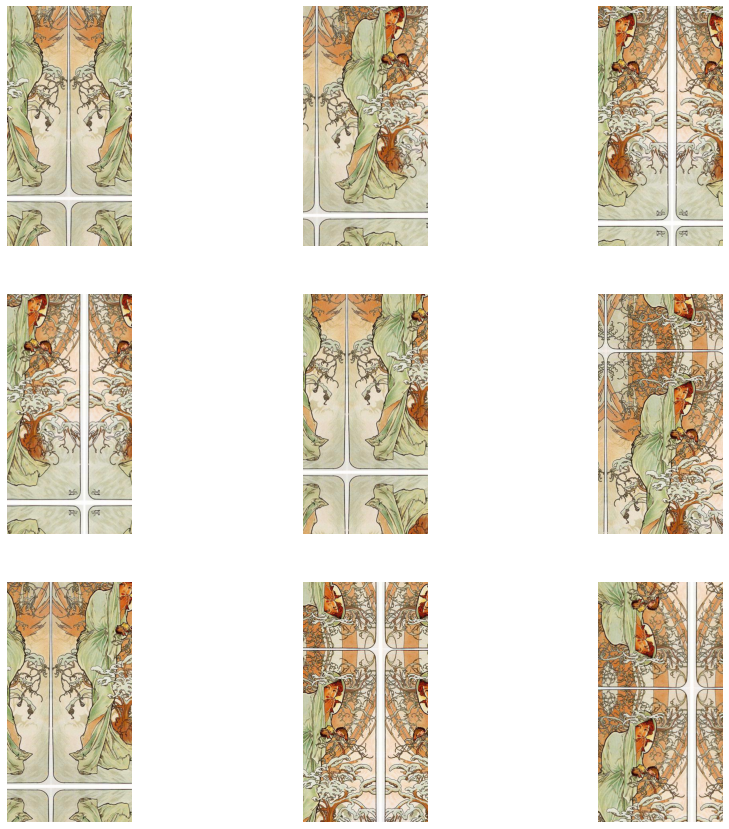

In [13]:
from tensorflow.keras.layers.experimental.preprocessing import RandomTranslation

image = original_img

height_factor = (-0.5, 0.5)
width_factor = (-0.5, 0.5)

data_augmentation = tf.keras.Sequential([
  RandomTranslation(height_factor=height_factor,
                    width_factor=width_factor),
])

display_augmentation(image, data_augmentation)

# 7. [ Random Width](https://www.tensorflow.org/versions/r2.5/api_docs/python/tf/keras/layers/experimental/preprocessing/RandomWidth)

Randomly vary the width.

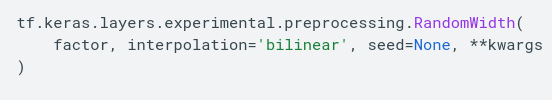

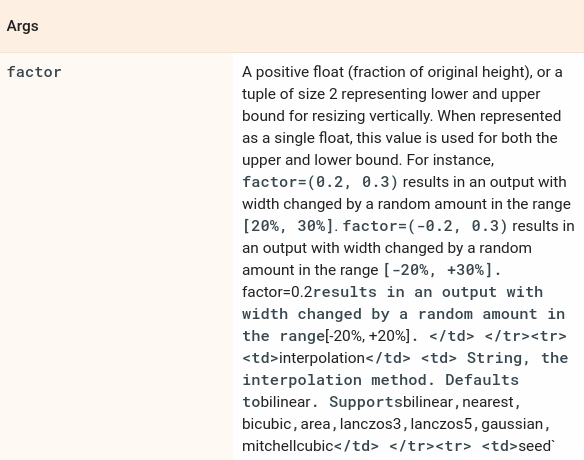

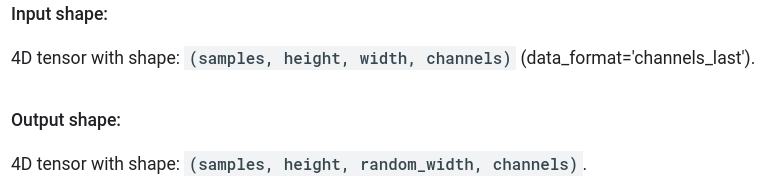

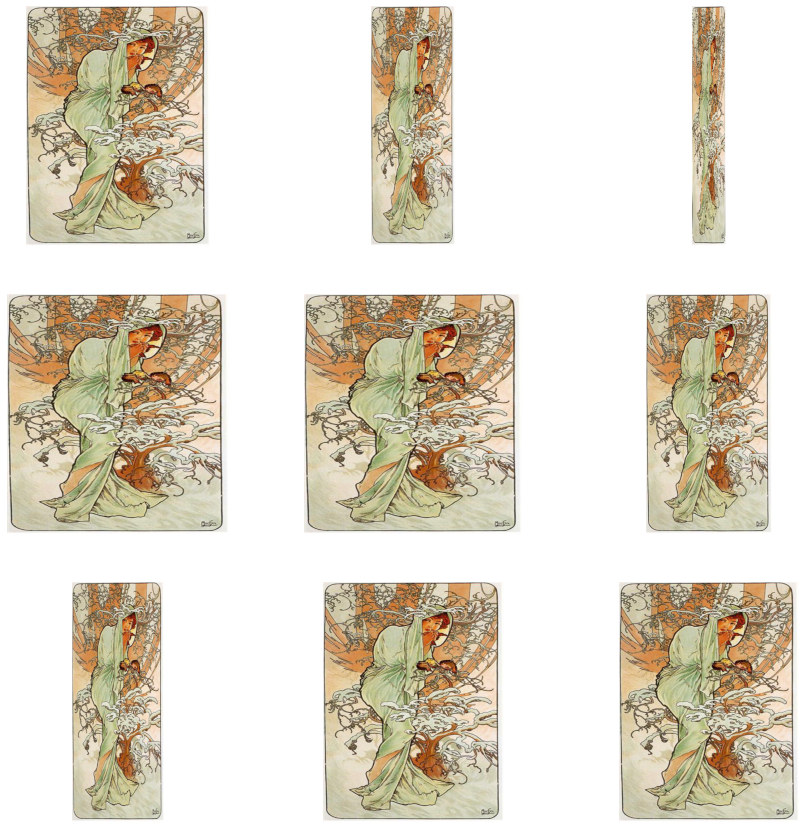

In [14]:
from tensorflow.keras.layers.experimental.preprocessing import RandomWidth

image = original_img

data_augmentation = tf.keras.Sequential([
    Rescaling(1./255),
    RandomWidth((-0.8, 0.8))
])

display_augmentation(image, data_augmentation)

# 8. [Random Zoom](https://www.tensorflow.org/versions/r2.5/api_docs/python/tf/keras/layers/experimental/preprocessing/RandomZoom)

Randomly zoom each image.

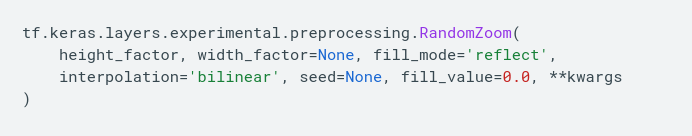

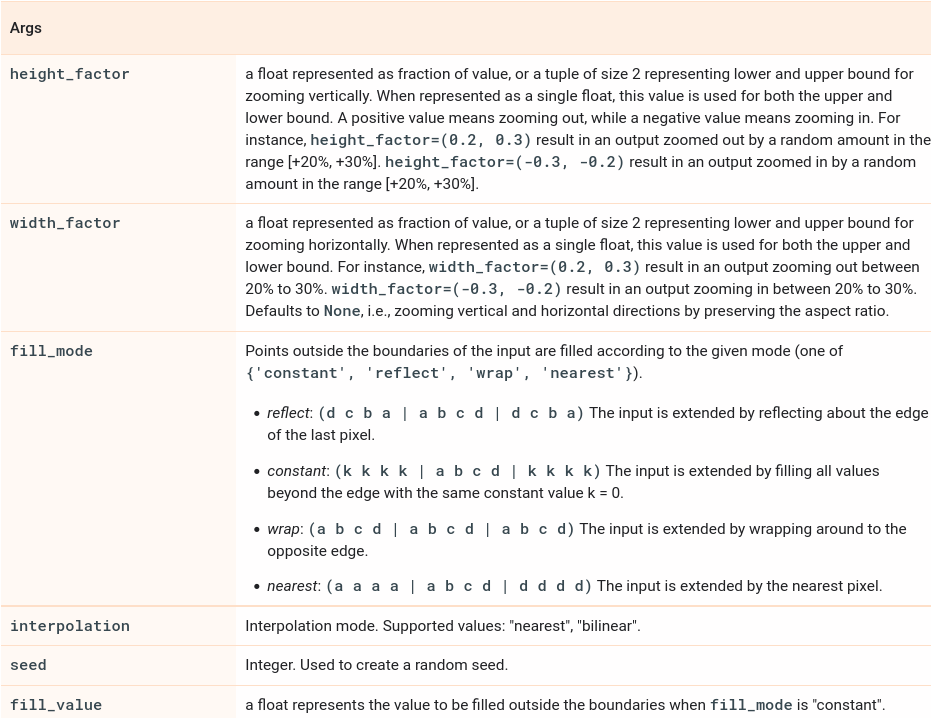

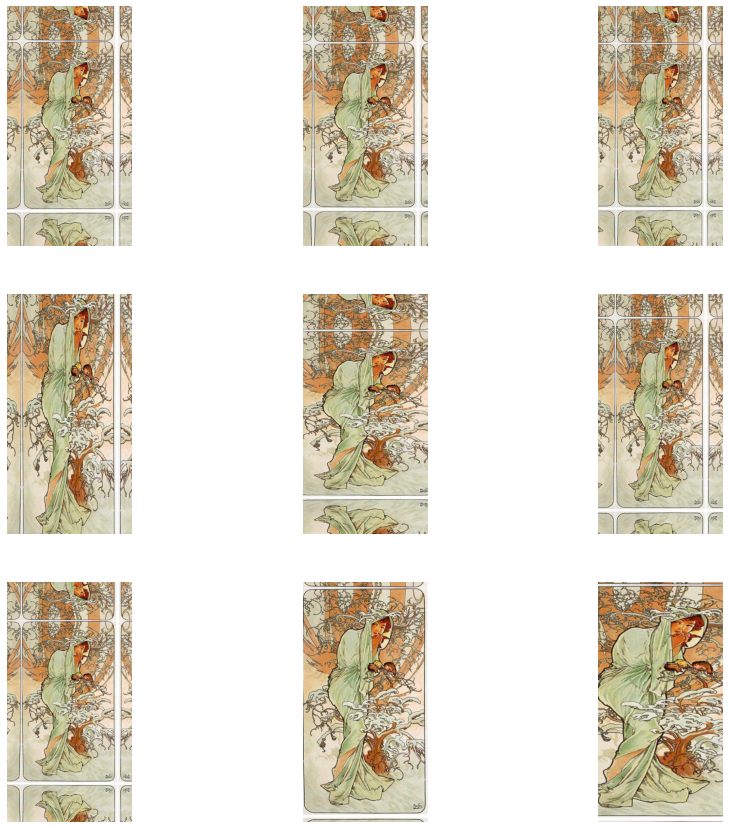

In [15]:
from tensorflow.keras.layers.experimental.preprocessing import RandomZoom

image = original_img

height_factor = (-0.5, 0.5)
width_factor = (-0.5, 0.5)

data_augmentation = tf.keras.Sequential([
  RandomZoom(height_factor=height_factor,
             width_factor=width_factor)
])

display_augmentation(image, data_augmentation)

# 9. [RGB to Grayscale](https://www.tensorflow.org/versions/r2.5/api_docs/python/tf/image/rgb_to_grayscale)

Converts one or more images from RGB to Grayscale

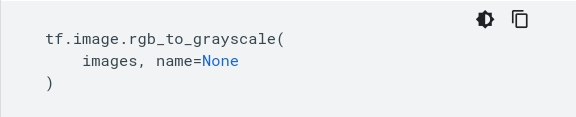

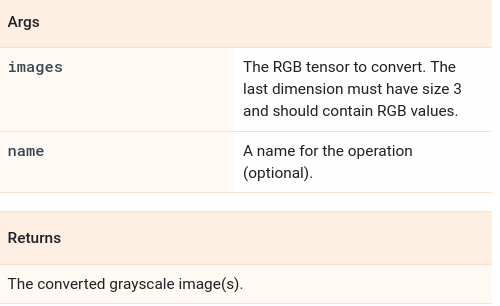

Number of channels = 1


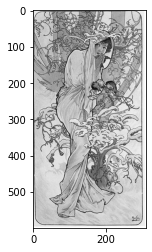

In [16]:
from tensorflow.image import rgb_to_grayscale

image = rgb_to_grayscale(original_img)

print(f'Number of channels = {image.shape[2]}')

plt.imshow(image, cmap='gray')

# 10. [Random Saturation](https://www.tensorflow.org/versions/r2.5/api_docs/python/tf/image/random_saturation)

Adjust the saturation of RGB images by a random factor.

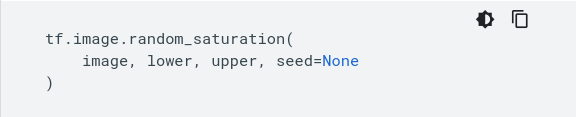

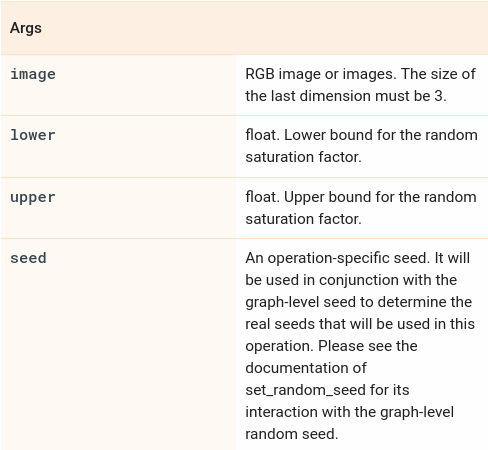



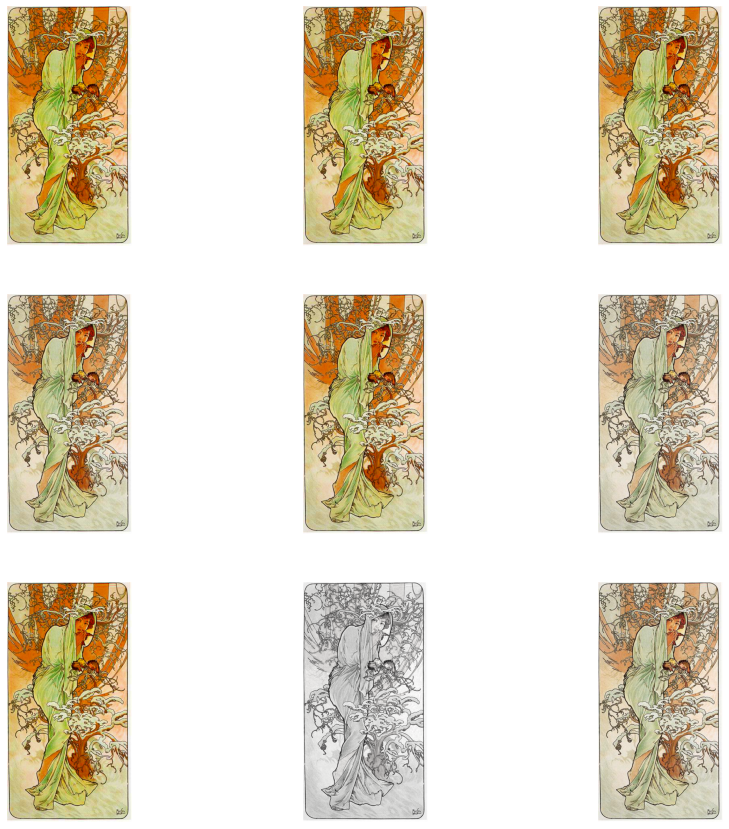

In [17]:
plt.figure(figsize=(15, 15))

for i in range(9):

    # augment image
    augmented_image = tf.image.random_saturation(original_img, 0, 3)

    ax = plt.subplot(3, 3, i + 1)

    plt.imshow(augmented_image)

    plt.axis("off")

In [21]:
os.system('jupyter nbconvert --to html Tabaka_Marcin_shapes_of_winter.ipynb')

0